In [ ]:
!pip install -q segmentation-models-pytorch


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.4 MB/s eta 0:00:00


In [ ]:
import segmentation_models_pytorch as smp
import torch

# Example: U-Net with DenseNet-121 backbone
model = smp.Unet(
    encoder_name="densenet121",        # you can try densenet121, densenet169, densenet201
    encoder_weights="imagenet",        # use pretrained ImageNet weights
    in_channels=3,                     # RGB images
    classes=1                          # binary segmentation (change for multi-class)
)

print(f"Model created: {type(model)}")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

Model created: <class 'segmentation_models_pytorch.decoders.unet.model.Unet'>


In [ ]:
import torch
import torch.nn as nn
import segmentation_models_pytorch as smp

# Check device
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

# Build U-Net with DenseNet backbone
# (DenseNet100 is not in SMP, closest is DenseNet121, 169, 201)
model = smp.Unet(
    encoder_name="densenet121",    # try "densenet169" or "densenet201" for bigger ones
    encoder_weights="imagenet",    # use pre-trained weights
    in_channels=3,                 # RGB input
    classes=1,                     # binary segmentation (mitosis vs background)
)

model = model.to(DEVICE)
print("Model ready: U-Net with DenseNet121 backbone")


Using device: cpu
Model ready: U-Net with DenseNet121 backbone


In [ ]:
# (Optional) Mount Drive if your dataset is in Drive
from google.colab import drive
drive.mount('/content/drive')

!pip -q install albumentations==1.4.7 --no-deps


Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.7/155.7 kB 5.2 MB/s eta 0:00:00


In [ ]:
# Install roboflow
!pip install roboflow

# Step 3: Authenticate & download dataset
from roboflow import Roboflow

rf = Roboflow(api_key="gJ3HEvdVTZSuII3EvZ27")
project = rf.workspace("mitosisdetection").project("ms-mitosis-detection2")
version = project.version(1)
dataset = version.download("yolov8")   # this will take some time, let it finish

print("Dataset downloaded to:", dataset.location)

# Step 4: Verify files
!ls {dataset.location}



loading Roboflow workspace...
loading Roboflow project...
Dataset downloaded to: /content/ms-mitosis-detection2-1
roboflow.zip


In [ ]:
# Directory Structure

import os

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp'}

def is_image_file(filename):
    return os.path.splitext(filename)[1].lower() in IMAGE_EXTENSIONS

def list_directory(path, indent=0):
    try:
        items = sorted(os.listdir(path))
    except PermissionError:
        print('  ' * indent + '📁 [Permission Denied]')
        return

    image_count = 0
    image_limit_hit = False

    for item in items:
        full_path = os.path.join(path, item)
        is_dir = os.path.isdir(full_path)
        is_image = is_image_file(item)

        if is_image:
            if image_count < 5:
                print('  ' * indent + f'🖼️ {item}')
            image_count += 1
            if image_count == 6 and not image_limit_hit:
                print('  ' * indent + '...')
                image_limit_hit = True
            continue

        if is_dir:
            print('  ' * indent + f'📁 {item}/')
            list_directory(full_path, indent + 1)
        elif not is_image:
            print('  ' * indent + f'📄 {item}')

datasets_folder = "/content/ms-mitosis-detection2-1"

if os.path.exists(datasets_folder):
    print(f"Mapping contents of '{datasets_folder}'...\n")
    list_directory(datasets_folder)
else:
    print(f"The folder '{datasets_folder}' does not exist.")


Mapping contents of '/content/ms-mitosis-detection2-1'...

📄 roboflow.zip


In [ ]:
import os

def list_directory(path, indent=0, max_files=5):
    try:
        items = sorted(os.listdir(path))
    except PermissionError:
        print('  ' * indent + '📁 [Permission Denied]')
        return

    shown = 0
    for item in items:
        full_path = os.path.join(path, item)
        if os.path.isdir(full_path):
            print('  ' * indent + f'📁 {item}/')
            list_directory(full_path, indent + 1, max_files)
        else:
            if shown < max_files:
                print('  ' * indent + f'📄 {item}')
            elif shown == max_files:
                print('  ' * indent + '...')
            shown += 1

# 👇 Use the dataset Roboflow downloaded
datasets_folder = dataset.location

if os.path.exists(datasets_folder):
    print(f"Mapping contents of '{datasets_folder}'...\n")
    list_directory(datasets_folder, max_files=5)
else:
    print(f"The folder '{datasets_folder}' does not exist.")


Mapping contents of '/content/ms-mitosis-detection2-1'...

📄 roboflow.zip


In [ ]:
import os

base_path = '/content/ms-mitosis-detection2-1'
splits = ['train', 'valid', 'test']
image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}

for split in splits:
    folder_path = os.path.join(base_path, split, "images")  # ✅ go into split/images
    if os.path.exists(folder_path):
        image_files = [f for f in os.listdir(folder_path)
                       if os.path.splitext(f)[1].lower() in image_extensions]
        print(f"{split.capitalize()} images: {len(image_files)}")
    else:
        print(f"{split.capitalize()} folder not found.")


Train folder not found.
Valid folder not found.
Test folder not found.


In [ ]:
import os

base_path = "/content/ms-mitosis-detection2-1"
splits = ["train", "valid", "test"]

# Step 1: Count images and labels
for split in splits:
    img_dir = os.path.join(base_path, split, "images")
    lbl_dir = os.path.join(base_path, split, "labels")

    num_images = len(os.listdir(img_dir)) if os.path.exists(img_dir) else 0
    num_labels = len(os.listdir(lbl_dir)) if os.path.exists(lbl_dir) else 0

    print(f"{split.capitalize()} → Images: {num_images}, Labels: {num_labels}")

# Step 2: Show a few sample label files
label_dir = os.path.join(base_path, "train", "labels")
if os.path.exists(label_dir):
    sample_labels = os.listdir(label_dir)[:3]

    print("\nSample label files content:")
    for label_file in sample_labels:
        print(f"\n📄 {label_file}")
        with open(os.path.join(label_dir, label_file)) as f:
            print(f.read().strip())
else:
    print("\n⚠️ No labels found in train/labels")


Train → Images: 0, Labels: 0
Valid → Images: 0, Labels: 0
Test → Images: 0, Labels: 0

⚠️ No labels found in train/labels


In [ ]:
import os

for root, dirs, files in os.walk("/content/ms-mitosis-detection2-1", topdown=True):
    level = root.replace("/content/ms-mitosis-detection2-1", "").count(os.sep)
    indent = " " * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = " " * 2 * (level + 1)
    for f in files[:5]:  # show up to 5 files per folder
        print(f"{subindent}{f}")
    if len(files) > 5:
        print(f"{subindent}...")


ms-mitosis-detection2-1/
  roboflow.zip


In [ ]:
# Install roboflow
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="gJ3HEvdVTZSuII3EvZ27")
project = rf.workspace("mitosisdetection").project("ms-mitosis-detection2")
version = project.version(1)
dataset = version.download("coco")

print("Dataset downloaded to:", dataset.location)

# Step 4: Verify files
!ls {dataset.location}


loading Roboflow workspace...
loading Roboflow project...
Dataset downloaded to: /content/ms-mitosis-detection2-1
data.yaml  README.dataset.txt  README.roboflow.txt  roboflow.zip  test	train


In [ ]:
import glob

# Find any label file
txt_files = glob.glob("/content/ms-mitosis-detection2-1/**/*.txt", recursive=True)
print("Found:", len(txt_files))
print("Example file:", txt_files[0])

# Show its contents
with open(txt_files[0], "r") as f:
    print(f.read())


Found: 6446
Example file: /content/ms-mitosis-detection2-1/README.dataset.txt
# ms-mitosis-detection2 > 2023-06-11 6:31pm
https://universe.roboflow.com/mitosisdetection/ms-mitosis-detection2

Provided by a Roboflow user
License: CC BY 4.0




In [ ]:
import glob

# Only annotation txt files (exclude README)
label_files = glob.glob("/content/ms-mitosis-detection2-1/**/*.txt", recursive=True)
label_files = [f for f in label_files if "README" not in f]

print("Total annotation files:", len(label_files))
print("Example file:", label_files[0])

# Read first annotation
with open(label_files[0], "r") as f:
    print(f.read())


Total annotation files: 6444
Example file: /content/ms-mitosis-detection2-1/test/labels/A11_02Ad_jpg.rf.ac3553da0a61772fc94bf353d8c2a1b8.txt



In [ ]:
import os

# Pick one label file
label_file = label_files[0]
image_file = label_file.replace(".txt", ".jpg")  # adjust if .png

print("Label file:", label_file)
print("Image file:", image_file)

# Read YOLO annotations
with open(label_file, "r") as f:
    lines = f.readlines()

print("Annotations:")
for line in lines:
    cls, x, y, w, h = line.strip().split()
    print(f"class={cls}, x={x}, y={y}, w={w}, h={h}")


Label file: /content/ms-mitosis-detection2-1/test/labels/A11_02Ad_jpg.rf.ac3553da0a61772fc94bf353d8c2a1b8.txt
Image file: /content/ms-mitosis-detection2-1/test/labels/A11_02Ad_jpg.rf.ac3553da0a61772fc94bf353d8c2a1b8.jpg
Annotations:


In [ ]:
import os

images_dir = "/content/ms-mitosis-detection2-1/train/images"
all_images = os.listdir(images_dir)

print("Total images:", len(all_images))
print("First 20 images:")
for f in all_images[:20]:
    print(f)


Total images: 5423
First 20 images:
A03_03Cb_jpg.rf.03a324276a44ce9caf1e9aa7e9fd3dd6.jpg
A03_00Dd_jpg.rf.a5ebe4907838ebbfc9fe807e72a996ad.jpg
A05_01Ba_jpg.rf.a6824b62b7907fe2571711ad7bcdbf51.jpg
A04_03Ca_jpg.rf.977e05e3b2e668a3ba76d98cf8e455f2.jpg
A05_01Aa_jpg.rf.6ecceb57170a2c5688506a0f9456fb97.jpg
A05_01Ba_jpg.rf.7b721d44475380e818052a097455be85.jpg
A03_05Ac_jpg.rf.96a41b9bb6b3450f75f5350c234ba1dc.jpg
A04_02Bd_jpg.rf.db833d7467dbc715bd2bd6de8c38b033.jpg
A04_02Dc_jpg.rf.b47b193aa47383d9ef1dc278c38f3488.jpg
A04_06Ad_jpg.rf.6744ff8d400499d1be9cc5917e457601.jpg
A04_04Da_jpg.rf.a9e2aabac4142437b699a4844225ccdd.jpg
A04_07Ab_jpg.rf.07dfb40b41dd9b7e5b8d0d488685c374.jpg
A04_07Bd_jpg.rf.6d604b8b05971b173a5193a4ec966dc8.jpg
A03_03Db_jpg.rf.5cc1386f25710aa9ebfbbf2a4964acde.jpg
A03_03Bb_jpg.rf.ebec543f72f066ac8b1f2aa6fd29e906.jpg
A03_03Ca_jpg.rf.9cfded6db8f379b122b4c00d0e54a56a.jpg
A04_07Cc_jpg.rf.98c9d15713d1aafe04ab5ffdb5dd8da6.jpg
A05_02Ca_jpg.rf.9823a2a9f3b9daa260b7dd8f1caf6f47.jpg
A04_02Ad_j

No labels for A04_06Ad_jpg.rf.20f5f2795bc8c54da9a1cbf7067280be.jpg


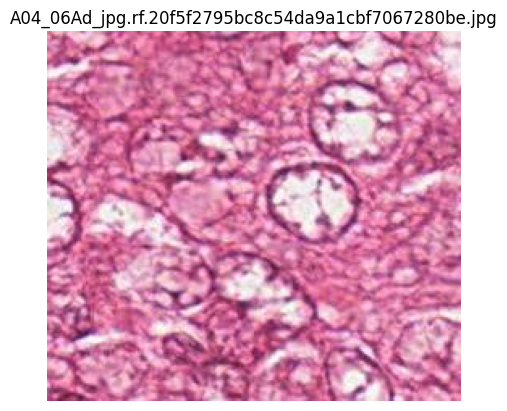

In [ ]:
import os
import random
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import yaml

# Paths
dataset_dir = "/content/ms-mitosis-detection2-1"
images_dir = os.path.join(dataset_dir, "train/images")
labels_dir = os.path.join(dataset_dir, "train/labels")
yaml_path   = os.path.join(dataset_dir, "data.yaml")

# Load class names from data.yaml
with open(yaml_path, "r") as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml["names"]

# Pick a random image
image_file = random.choice(os.listdir(images_dir))
image_path = os.path.join(images_dir, image_file)

# Corresponding label file
label_file = os.path.splitext(image_file)[0] + ".txt"
label_path = os.path.join(labels_dir, label_file)

# Open image
img = Image.open(image_path).convert("RGB")
draw = ImageDraw.Draw(img)
w, h = img.size

# Parse YOLO label file
if os.path.exists(label_path):
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                cls, x_c, y_c, bw, bh = map(float, parts)
                x_c, y_c, bw, bh = x_c*w, y_c*h, bw*w, bh*h
                x1, y1 = x_c - bw/2, y_c - bh/2
                x2, y2 = x_c + bw/2, y_c + bh/2

                # Draw box + label
                draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
                draw.text((x1, y1-10), class_names[int(cls)], fill="red")
else:
    print(f"No labels for {image_file}")

# Show
plt.imshow(img)
plt.axis("off")
plt.title(image_file)
plt.show()


In [ ]:
dataset_path = '/content/ms-mitosis-detection2-1'
split = 'train'

[INFO] Using split: test
[INFO] Images dir: /content/ms-mitosis-detection2-1/test/images
[INFO] Labels dir: /content/ms-mitosis-detection2-1/test/labels
[INFO] Loaded class names from data.yaml: ['mitosis_0-0', 'mitosis_0-2', 'mitosis_0-65', 'mitosis_0-8', 'mitosis_1-0']
[INFO] Total images found: 6444
[INFO] Selected image: A03_00Cd_jpg.rf.055619019388459cce6b41d481a92e9d.jpg
[INFO] Label file: /content/ms-mitosis-detection2-1/test/labels/A03_00Cd_jpg.rf.055619019388459cce6b41d481a92e9d.txt
[INFO] Image size: 256x229
[INFO] #Annotations: 4


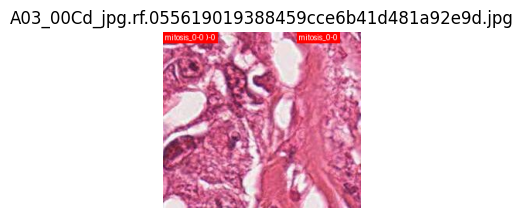

[INFO] Saved visualization to: /content/vis_A03_00Cd_jpg.rf.055619019388459cce6b41d481a92e9d.jpg


In [ ]:
# =========================
# STEP 0 — Imports & Setup
# =========================
import os, json, math
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# --- CONFIG: set your dataset split and optional filename filter
dataset_path = "/content/ms-mitosis-detection2-1"
split = "test"                  # "train" or "test"
filename_contains = ""          # e.g. "A11_07Ab" or leave "" to auto-pick the first labeled image

images_dir = os.path.join(dataset_path, split, "images")
labels_dir = os.path.join(dataset_path, split, "labels")
data_yaml  = os.path.join(dataset_path, "data.yaml")

assert os.path.isdir(images_dir), f"Images folder not found: {images_dir}"
assert os.path.isdir(labels_dir), f"Labels folder not found: {labels_dir}"

print(f"[INFO] Using split: {split}")
print(f"[INFO] Images dir: {images_dir}")
print(f"[INFO] Labels dir: {labels_dir}")

# ======================================
# STEP 1 — Load class names (from yaml)
# ======================================
names = None
try:
    import yaml
    with open(data_yaml, "r") as f:
        y = yaml.safe_load(f)
        names = y.get("names", None)
    if isinstance(names, dict):
        # sometimes names can be {0: 'class0', 1: 'class1', ...}
        names = [names[k] for k in sorted(names.keys())]
    print(f"[INFO] Loaded class names from data.yaml: {names}")
except Exception as e:
    print(f"[WARN] Could not read data.yaml: {e}")
    print("[WARN] Class IDs will be shown instead of names.")
    names = None

# =================================================
# STEP 2 — Helper to parse a YOLO .txt label file
# =================================================
def load_yolo_labels(label_path):
    """
    Each line: <class> <x_center> <y_center> <width> <height>
    All coords are normalized to [0,1] relative to image width/height.
    """
    if not os.path.exists(label_path):
        return []
    boxes = []
    with open(label_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = line.split()
            if len(parts) < 5:
                continue
            cls = int(float(parts[0]))
            xc, yc, w, h = map(float, parts[1:5])
            boxes.append({"class": cls, "xc": xc, "yc": yc, "w": w, "h": h})
    return boxes

# =========================================================
# STEP 3 — Convert normalized YOLO box to pixel coordinates
# =========================================================
def yolo_to_xyxy(box, img_w, img_h):
    """
    YOLO (xc,yc,w,h) -> pixel (x1,y1,x2,y2)
    """
    xc, yc, w, h = box["xc"], box["yc"], box["w"], box["h"]
    x1 = (xc - w/2.0) * img_w
    y1 = (yc - h/2.0) * img_h
    x2 = (xc + w/2.0) * img_w
    y2 = (yc + h/2.0) * img_h
    return [x1, y1, x2, y2]

# =========================================================
# STEP 4 — Choose an image (by filter or first with labels)
# =========================================================
image_files = sorted(os.listdir(images_dir))
print(f"[INFO] Total images found: {len(image_files)}")

candidate = None
if filename_contains:
    for fn in image_files:
        if filename_contains in fn:
            candidate = fn
            break
    if candidate is None:
        raise FileNotFoundError(f"No image filename contains '{filename_contains}' in {images_dir}")

if candidate is None:
    # find the first image that has a non-empty label file
    for fn in image_files:
        base = os.path.splitext(fn)[0]
        label_path = os.path.join(labels_dir, base + ".txt")
        if os.path.exists(label_path) and len(load_yolo_labels(label_path)) > 0:
            candidate = fn
            break

if candidate is None:
    raise RuntimeError("Could not find any image with labels. Try setting `filename_contains` to a known image base.")

image_path = os.path.join(images_dir, candidate)
label_path = os.path.join(labels_dir, os.path.splitext(candidate)[0] + ".txt")

print(f"[INFO] Selected image: {candidate}")
print(f"[INFO] Label file: {label_path}")

# =========================================================
# STEP 5 — Load image and its YOLO annotations
# =========================================================
img = Image.open(image_path).convert("RGB")
W, H = img.size
anns = load_yolo_labels(label_path)
print(f"[INFO] Image size: {W}x{H}")
print(f"[INFO] #Annotations: {len(anns)}")

# =========================================================
# STEP 6 — Draw crisp boxes + labels (PIL)
# =========================================================
draw = ImageDraw.Draw(img)

# Try to load a default font (optional)
try:
    font = ImageFont.load_default()
except:
    font = None

for a in anns:
    x1, y1, x2, y2 = yolo_to_xyxy(a, W, H)
    # draw rectangle
    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)

    # prepare label text
    cls_id = a["class"]
    label = names[cls_id] if (names and 0 <= cls_id < len(names)) else str(cls_id)

    # draw a small filled label box for legibility
    text = f"{label}"
    if font is None:
        tw, th = draw.textbbox((0,0), text)[2:]
    else:
        tw, th = draw.textbbox((0,0), text, font=font)[2:]

    pad = 2
    bx1, by1 = x1, max(0, y1 - th - 2*pad)
    bx2, by2 = x1 + tw + 2*pad, by1 + th + 2*pad
    draw.rectangle([bx1, by1, bx2, by2], fill="red")
    draw.text((bx1 + pad, by1 + pad), text, fill="white", font=font)

# =========================================================
# STEP 7 — Show the image clearly + save a copy
# =========================================================
# Figure size that roughly matches pixel density for crisp display
dpi = 100
plt.figure(figsize=(W/dpi, H/dpi), dpi=dpi)
plt.imshow(img)
plt.axis("off")
plt.title(candidate)
plt.show()

out_path = os.path.join("/content", f"vis_{candidate}")
img.save(out_path)
print(f"[INFO] Saved visualization to: {out_path}")


[INFO] Selected 5 images with labels.


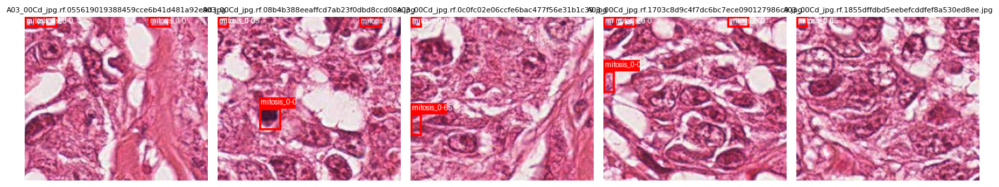

In [ ]:
# =========================
# MULTI-IMAGE VISUALIZATION
# =========================
import os
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import yaml

# --- CONFIG ---
dataset_path = "/content/ms-mitosis-detection2-1"
split = "test"     # or "train"
num_images = 5     # how many images to visualize

images_dir = os.path.join(dataset_path, split, "images")
labels_dir = os.path.join(dataset_path, split, "labels")
data_yaml  = os.path.join(dataset_path, "data.yaml")

# --- Load class names ---
with open(data_yaml, "r") as f:
    y = yaml.safe_load(f)
names = y.get("names", [])
if isinstance(names, dict):
    names = [names[k] for k in sorted(names.keys())]

# --- Helper: load YOLO labels ---
def load_yolo_labels(label_path):
    if not os.path.exists(label_path):
        return []
    boxes = []
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls = int(float(parts[0]))
                xc, yc, w, h = map(float, parts[1:5])
                boxes.append({"class": cls, "xc": xc, "yc": yc, "w": w, "h": h})
    return boxes

# --- Convert normalized box to pixels ---
def yolo_to_xyxy(box, img_w, img_h):
    xc, yc, w, h = box["xc"], box["yc"], box["w"], box["h"]
    x1 = (xc - w/2.0) * img_w
    y1 = (yc - h/2.0) * img_h
    x2 = (xc + w/2.0) * img_w
    y2 = (yc + h/2.0) * img_h
    return [x1, y1, x2, y2]

# --- Pick first N images with labels ---
image_files = sorted(os.listdir(images_dir))
selected_images = []
for fn in image_files:
    base = os.path.splitext(fn)[0]
    label_path = os.path.join(labels_dir, base + ".txt")
    if os.path.exists(label_path) and len(load_yolo_labels(label_path)) > 0:
        selected_images.append(fn)
    if len(selected_images) >= num_images:
        break

print(f"[INFO] Selected {len(selected_images)} images with labels.")

# --- Visualization ---
fig, axes = plt.subplots(1, len(selected_images), figsize=(15, 15))
if len(selected_images) == 1:
    axes = [axes]  # ensure iterable

for ax, candidate in zip(axes, selected_images):
    image_path = os.path.join(images_dir, candidate)
    label_path = os.path.join(labels_dir, os.path.splitext(candidate)[0] + ".txt")

    img = Image.open(image_path).convert("RGB")
    W, H = img.size
    anns = load_yolo_labels(label_path)

    draw = ImageDraw.Draw(img)
    try:
        font = ImageFont.load_default()
    except:
        font = None

    for a in anns:
        x1, y1, x2, y2 = yolo_to_xyxy(a, W, H)
        draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
        cls_id = a["class"]
        label = names[cls_id] if (names and 0 <= cls_id < len(names)) else str(cls_id)
        text = f"{label}"
        pad = 2
        bx1, by1 = x1, max(0, y1 - 15)
        bx2, by2 = x1 + 50, y1
        draw.rectangle([bx1, by1, bx2, by2], fill="red")
        draw.text((bx1+pad, by1), text, fill="white", font=font)

    ax.imshow(img)
    ax.axis("off")
    ax.set_title(candidate, fontsize=8)

plt.tight_layout()
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models


In [ ]:
from torchvision.models.densenet import DenseNet

def densenet100(num_classes=2):  # binary classification: mitosis vs non-mitosis
    # growth_rate=12 is standard for DenseNet-100
    return DenseNet(growth_rate=12, block_config=(16, 16, 16), num_init_features=24, num_classes=num_classes)


In [ ]:
# Example: 2 classes (mitosis / non-mitosis)
model = densenet100(num_classes=2)

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

print(model)


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 24, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(24, 48, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(48, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(36, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1):

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


In [ ]:
import zipfile

zip_path = "/content/ms-mitosis-detection2-1/roboflow.zip"
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall("/content/ms-mitosis-detection2-1/")

print("✅ Extracted roboflow.zip again. Check if train/labels is now available.")


✅ Extracted roboflow.zip again. Check if train/labels is now available.


Image: A11_01Ba_jpg.rf.b9c1a2e23c2c625dfc07dbfd45d641a3.jpg


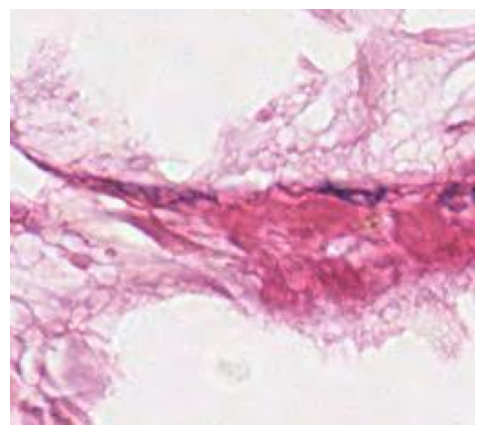

Image: A14_08Bc_jpg.rf.180b90dabffb4d811a6313bacf123396.jpg


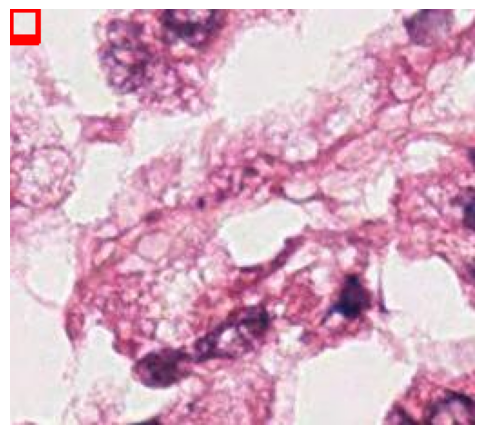

Image: A17_02Ca_jpg.rf.d73bb8f2516bdd3200415a78d1d54d61.jpg


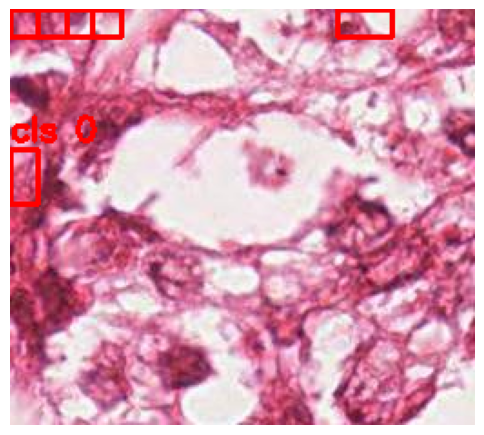

Image: A11_04Ad_jpg.rf.9fa6c487ff5ec86ce17cd1371cfdf0df.jpg


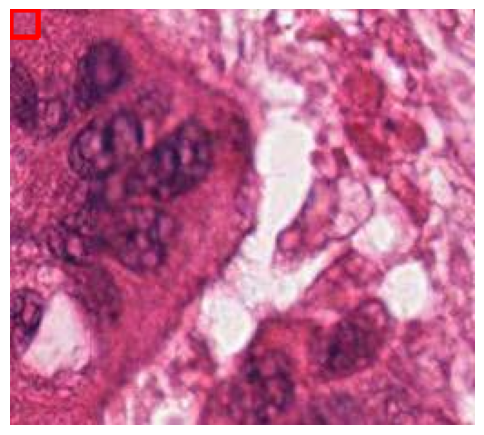

Image: A05_04Bb_jpg.rf.ddcf49f721713acf294360e097c20b26.jpg


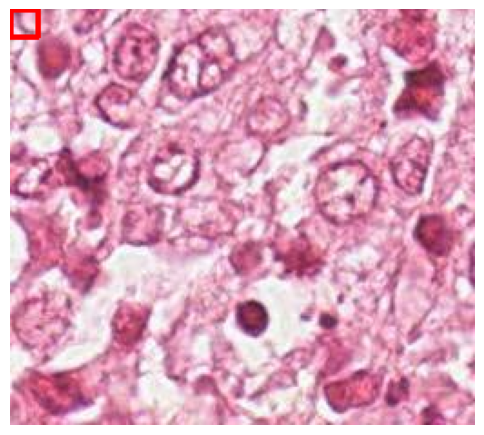

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random

# Paths
dataset_path = "/content/ms-mitosis-detection2-1"
split = "test"   # change to "train" if train labels exist
img_dir = os.path.join(dataset_path, split, "images")
lbl_dir = os.path.join(dataset_path, split, "labels")

# Get all images
image_files = [f for f in os.listdir(img_dir) if f.endswith(".jpg")]

# Randomly pick 5
sample_files = random.sample(image_files, 5)

def plot_image_with_boxes(image_path, label_path):
    # Load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    # Draw bounding boxes if label file exists
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                cls, x, y, bw, bh = map(float, line.strip().split())

                # Convert YOLO format → pixel coords
                x1 = int((x - bw/2) * w)
                y1 = int((y - bh/2) * h)
                x2 = int((x + bw/2) * w)
                y2 = int((y + bh/2) * h)

                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                cv2.putText(img, f"cls {int(cls)}", (x1, y1-5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

    # Show image
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


# Show 5 random images with annotations
for img_file in sample_files:
    img_path = os.path.join(img_dir, img_file)
    lbl_file = os.path.splitext(img_file)[0] + ".txt"
    lbl_path = os.path.join(lbl_dir, lbl_file)

    print(f"Image: {img_file}")
    plot_image_with_boxes(img_path, lbl_path)


Image: A14_08Bc_jpg.rf.fe86ddec6fe050ebe05da0d8b5274163.jpg


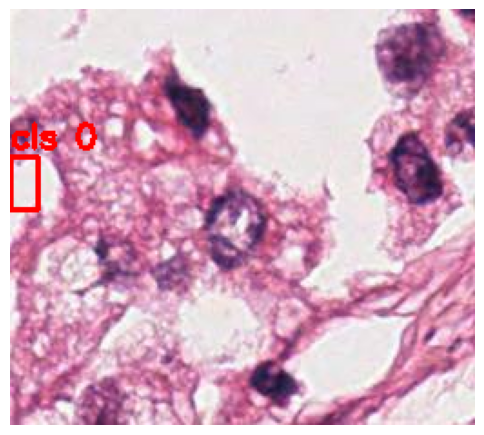

Image: A11_04Cd_jpg.rf.bf7ff2dba6305781f87f8a613ab40333.jpg


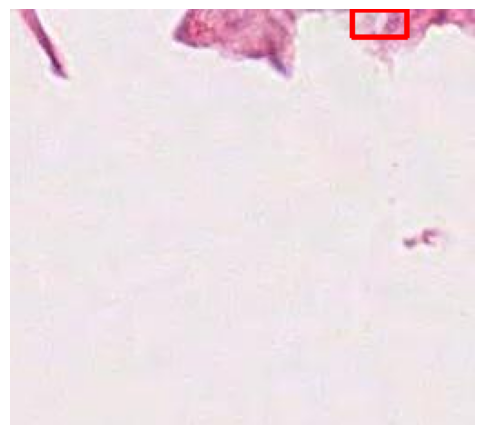

Image: A17_00Bd_jpg.rf.9bda0b315fab8c4724318f151a11ccde.jpg


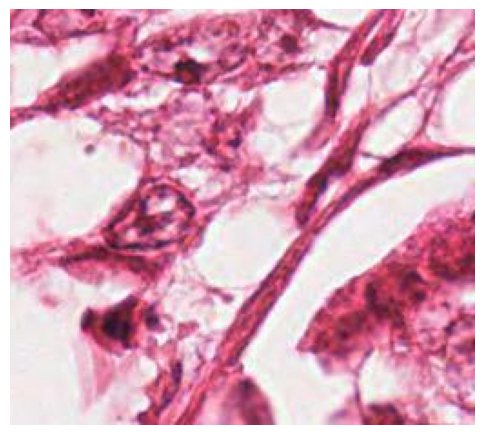

Image: A10_00Ad_jpg.rf.30c30692403ac7505b3b642167f24f48.jpg


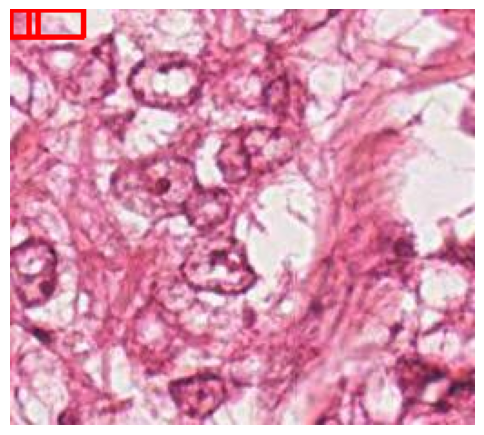

Image: A11_02Ca_jpg.rf.9866f39a41ae9e936042ad211670a0e9.jpg


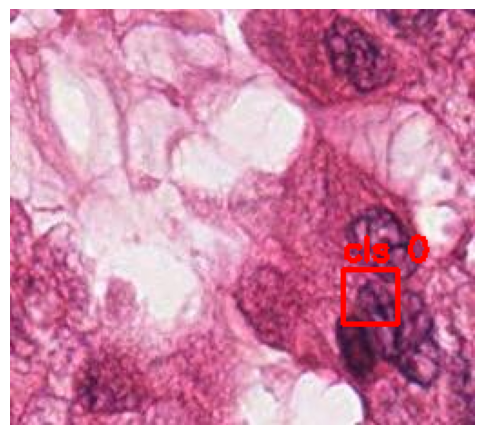

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random

# Paths
dataset_path = "/content/ms-mitosis-detection2-1"
split = "test"   # change to "train" if train labels exist
img_dir = os.path.join(dataset_path, split, "images")
lbl_dir = os.path.join(dataset_path, split, "labels")

# Get all images
image_files = [f for f in os.listdir(img_dir) if f.endswith(".jpg")]

# Randomly pick 5
sample_files = random.sample(image_files, 5)

def plot_image_with_boxes(image_path, label_path):
    # Load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    # Draw bounding boxes if label file exists
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                cls, x, y, bw, bh = map(float, line.strip().split())

                # Convert YOLO format → pixel coords
                x1 = int((x - bw/2) * w)
                y1 = int((y - bh/2) * h)
                x2 = int((x + bw/2) * w)
                y2 = int((y + bh/2) * h)

                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                cv2.putText(img, f"cls {int(cls)}", (x1, y1-5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

    # Show image
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


# Show 5 random images with annotations
for img_file in sample_files:
    img_path = os.path.join(img_dir, img_file)
    lbl_file = os.path.splitext(img_file)[0] + ".txt"
    lbl_path = os.path.join(lbl_dir, lbl_file)

    print(f"Image: {img_file}")
    plot_image_with_boxes(img_path, lbl_path)


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.8 MB/s eta 0:00:00



image 1/1 /content/ms-mitosis-detection2-1/test/images/A04_04Cd_jpg.rf.97d790c6a5a9cbac4f1464d0d2011bcc.jpg: 576x640 (no detections), 192.6ms
Speed: 3.8ms preprocess, 192.6ms inference, 1.2ms postprocess per image at shape (1, 3, 576, 640)


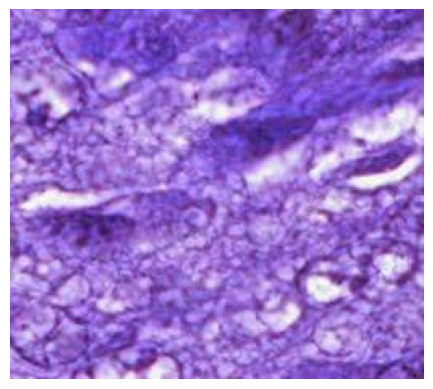


image 1/1 /content/ms-mitosis-detection2-1/test/images/A04_03Cd_jpg.rf.a7fd4329b9bbd31981f9ab2b71c2923c.jpg: 576x640 (no detections), 223.7ms
Speed: 5.1ms preprocess, 223.7ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 640)


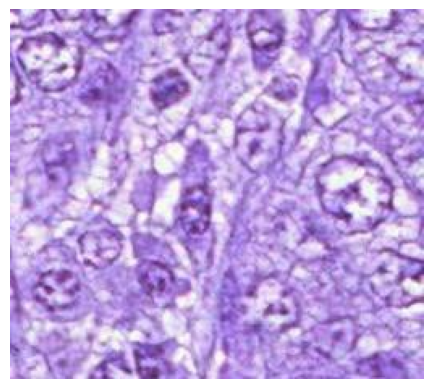


image 1/1 /content/ms-mitosis-detection2-1/test/images/A05_06Aa_jpg.rf.976fc931dc95da5bb624e0dab0c59771.jpg: 576x640 (no detections), 217.8ms
Speed: 4.6ms preprocess, 217.8ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 640)


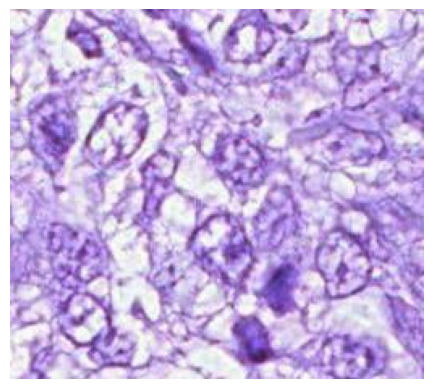


image 1/1 /content/ms-mitosis-detection2-1/test/images/A11_01Ab_jpg.rf.e050568fd1da6b5403070ecf0aaba725.jpg: 576x640 (no detections), 211.4ms
Speed: 5.0ms preprocess, 211.4ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 640)


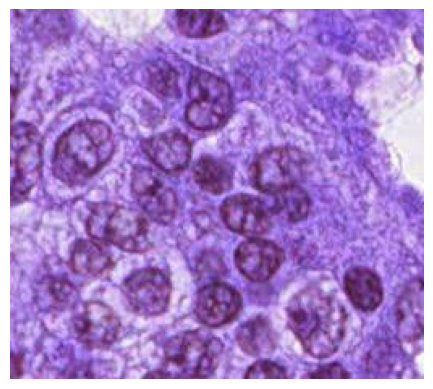


image 1/1 /content/ms-mitosis-detection2-1/test/images/A18_02Ad_jpg.rf.c5351bc98e529581861767b07a06b5af.jpg: 576x640 1 cat, 236.9ms
Speed: 3.9ms preprocess, 236.9ms inference, 1.6ms postprocess per image at shape (1, 3, 576, 640)


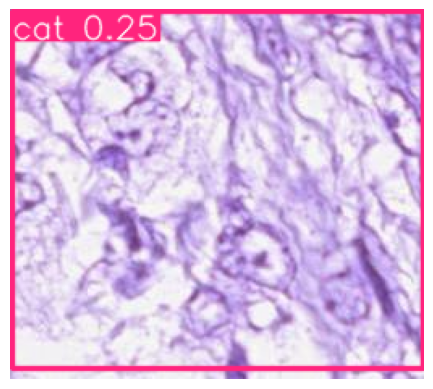

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import random
import os

# Load a pretrained YOLO model (COCO-trained, NOT your dataset)
model = YOLO("yolov8n.pt")  # you can use yolov8s.pt, yolov8m.pt, etc.

# Path to your dataset images (test folder)
img_dir = "/content/ms-mitosis-detection2-1/test/images"
img_files = os.listdir(img_dir)

# Pick 5 random images
sample_images = random.sample(img_files, 5)

for img_name in sample_images:
    img_path = os.path.join(img_dir, img_name)

    # Run prediction
    results = model.predict(source=img_path, conf=0.25)

    # Plot results
    results[0].plot()  # save prediction visualization
    plt.imshow(results[0].plot())
    plt.axis("off")
    plt.show()


Saving A03_00Aa_jpg.rf.3ad1861ff206ba2011117e16cde3b899.jpg to A03_00Aa_jpg.rf.3ad1861ff206ba2011117e16cde3b899.jpg
Saving A03_00Aa_jpg.rf.5f2ded1b87d60ffaa5bf4f5639400be3.jpg to A03_00Aa_jpg.rf.5f2ded1b87d60ffaa5bf4f5639400be3.jpg
Saving A03_00Aa_jpg.rf.6bc85eab9048f1a617e5705d93f5bc4c.jpg to A03_00Aa_jpg.rf.6bc85eab9048f1a617e5705d93f5bc4c.jpg
Saving A03_00Aa_jpg.rf.8a769cd009d8d9b50ec333177d92c725.jpg to A03_00Aa_jpg.rf.8a769cd009d8d9b50ec333177d92c725.jpg
Saving A03_00Aa_jpg.rf.16022bd276f99f388c25a2cda63c44ad.jpg to A03_00Aa_jpg.rf.16022bd276f99f388c25a2cda63c44ad.jpg
Saving A03_00Aa_jpg.rf.813928addd82caa25ea0ea54e96f2d0c.jpg to A03_00Aa_jpg.rf.813928addd82caa25ea0ea54e96f2d0c.jpg

image 1/1 /content/A03_00Aa_jpg.rf.3ad1861ff206ba2011117e16cde3b899.jpg: 576x640 (no detections), 208.0ms
Speed: 3.4ms preprocess, 208.0ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 640)


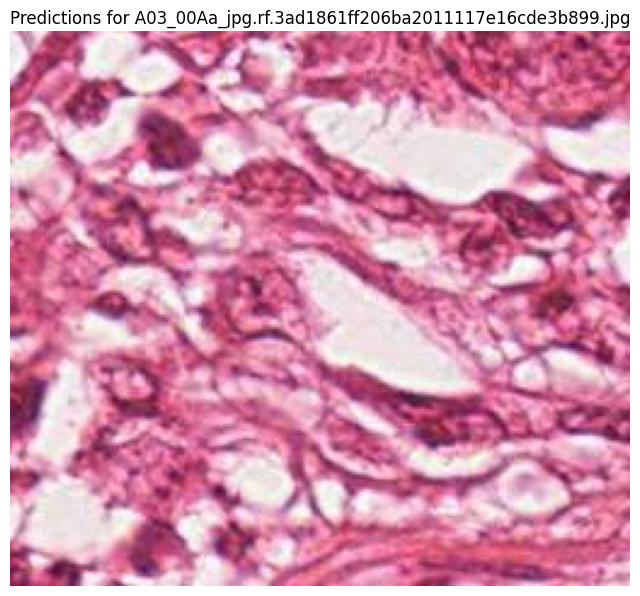


image 1/1 /content/A03_00Aa_jpg.rf.5f2ded1b87d60ffaa5bf4f5639400be3.jpg: 576x640 (no detections), 221.2ms
Speed: 4.0ms preprocess, 221.2ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 640)


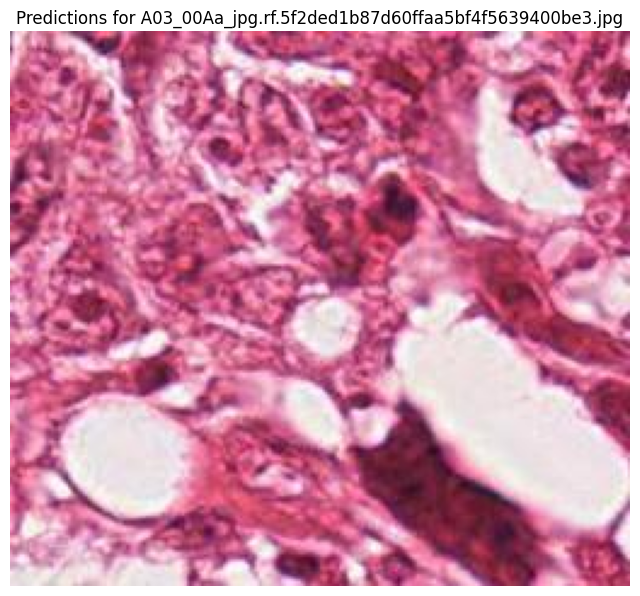


image 1/1 /content/A03_00Aa_jpg.rf.6bc85eab9048f1a617e5705d93f5bc4c.jpg: 576x640 (no detections), 245.3ms
Speed: 5.5ms preprocess, 245.3ms inference, 1.3ms postprocess per image at shape (1, 3, 576, 640)


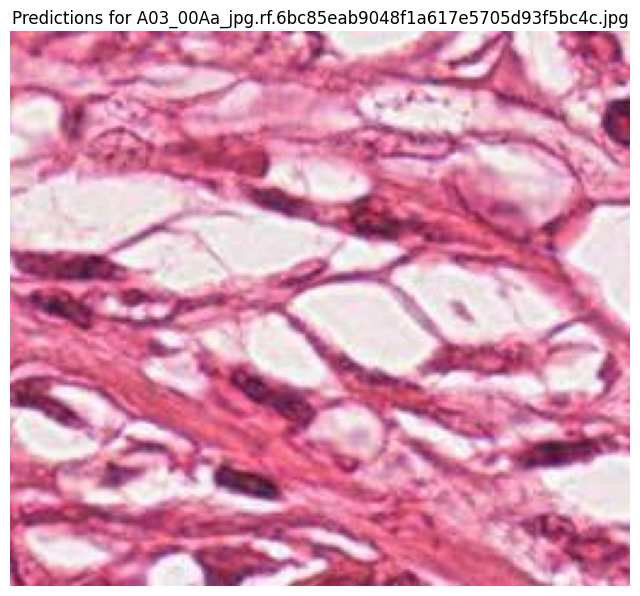


image 1/1 /content/A03_00Aa_jpg.rf.8a769cd009d8d9b50ec333177d92c725.jpg: 576x640 (no detections), 266.2ms
Speed: 5.3ms preprocess, 266.2ms inference, 1.2ms postprocess per image at shape (1, 3, 576, 640)


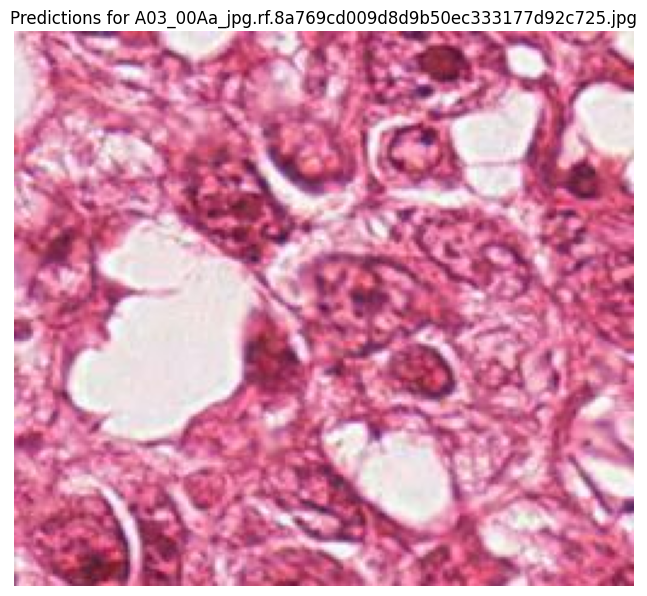


image 1/1 /content/A03_00Aa_jpg.rf.16022bd276f99f388c25a2cda63c44ad.jpg: 576x640 (no detections), 254.8ms
Speed: 4.3ms preprocess, 254.8ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 640)


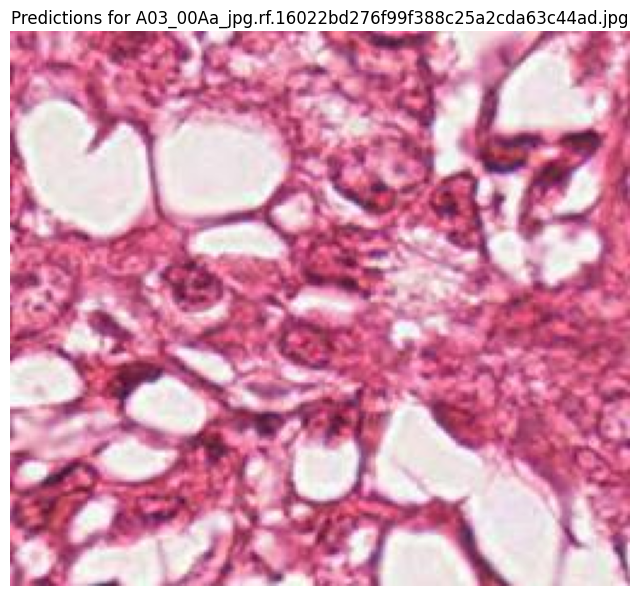


image 1/1 /content/A03_00Aa_jpg.rf.813928addd82caa25ea0ea54e96f2d0c.jpg: 576x640 (no detections), 297.7ms
Speed: 5.0ms preprocess, 297.7ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 640)


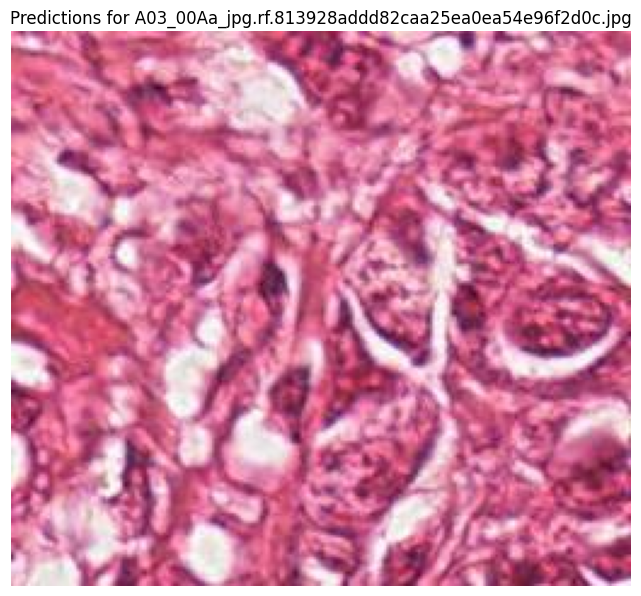

In [ ]:
from google.colab import files
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Upload multiple images
uploaded = files.upload()   # select 5 (or more) images

# List of uploaded image paths
image_paths = list(uploaded.keys())

# Load pretrained YOLO model (replace with your trained weights if available)
model = YOLO("yolov8n.pt")

# Run inference on each image
for image_path in image_paths:
    results = model.predict(image_path, conf=0.25)

    # Plot each detection
    for r in results:
        im_bgr = r.plot()
        im_rgb = im_bgr[:, :, ::-1]  # BGR → RGB
        plt.figure(figsize=(8,8))
        plt.imshow(im_rgb)
        plt.title(f"Predictions for {image_path}")
        plt.axis("off")
        plt.show()
